In [2]:
pip install imblearn

You should consider upgrading via the '/usr/local/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install ydata-profiling

You should consider upgrading via the '/usr/local/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [1]:
import warnings
warnings.filterwarnings('ignore')
from category_encoders import MEstimateEncoder
from imblearn.over_sampling import SMOTE
from ydata_profiling import ProfileReport
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

In [2]:
df = pd.read_csv("application_record.csv")

In [3]:
df2 = pd.read_csv("credit_record.csv")

In [4]:
df.describe(include='all')

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
count,4.385570e+05,438557,438557,438557,438557.000000,4.385570e+05,438557,438557,438557,438557,438557.000000,438557.000000,438557.0,438557.000000,438557.000000,438557.000000,304354,438557.000000
unique,NaN,2,2,2,NaN,NaN,5,5,5,6,NaN,NaN,NaN,NaN,NaN,NaN,18,NaN
top,NaN,F,N,Y,NaN,NaN,Working,Secondary / secondary special,Married,House / apartment,NaN,NaN,NaN,NaN,NaN,NaN,Laborers,NaN
freq,NaN,294440,275459,304074,NaN,NaN,226104,301821,299828,393831,NaN,NaN,NaN,NaN,NaN,NaN,78240,NaN
mean,6.022176e+06,NaN,NaN,NaN,0.427390,1.875243e+05,NaN,NaN,NaN,NaN,-15997.904649,60563.675328,1.0,0.206133,0.287771,0.108207,NaN,2.194465
std,5.716370e+05,NaN,NaN,NaN,0.724882,1.100869e+05,NaN,NaN,NaN,NaN,4185.030007,138767.799647,0.0,0.404527,0.452724,0.310642,NaN,0.897207
min,5.008804e+06,NaN,NaN,NaN,0.000000,2.610000e+04,NaN,NaN,NaN,NaN,-25201.000000,-17531.000000,1.0,0.000000,0.000000,0.000000,NaN,1.000000
25%,5.609375e+06,NaN,NaN,NaN,0.000000,1.215000e+05,NaN,NaN,NaN,NaN,-19483.000000,-3103.000000,1.0,0.000000,0.000000,0.000000,NaN,2.000000
50%,6.047745e+06,NaN,NaN,NaN,0.000000,1.607805e+05,NaN,NaN,NaN,NaN,-15630.000000,-1467.000000,1.0,0.000000,0.000000,0.000000,NaN,2.000000
75%,6.456971e+06,NaN,NaN,NaN,1.000000,2.250000e+05,NaN,NaN,NaN,NaN,-12514.000000,-371.000000,1.0,0.000000,1.000000,0.000000,NaN,3.000000


In [5]:
df.shape

(438557, 18)

In [6]:
df2.describe(include='all')

,ID,MONTHS_BALANCE,STATUS
count,1.048575e+06,1.048575e+06,1048575
unique,NaN,NaN,8
top,NaN,NaN,C
freq,NaN,NaN,442031
mean,5.068286e+06,-1.913700e+01,NaN
std,4.615058e+04,1.402350e+01,NaN
min,5.001711e+06,-6.000000e+01,NaN
25%,5.023644e+06,-2.900000e+01,NaN
50%,5.062104e+06,-1.700000e+01,NaN
75%,5.113856e+06,-7.000000e+00,NaN


In [7]:
df2.shape

(1048575, 3)

In [8]:
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
profile = ProfileReport(df2)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
#each customer transaction history
grouped=df2.groupby('ID')['STATUS'].value_counts()
grouped

ID       STATUS
5001711  0          3
         X          1
5001712  0         10
         C          9
5001713  X         22
                   ..
5150483  X         18
5150484  0         12
         C          1
5150485  0          2
5150487  C         30
Name: STATUS, Length: 94143, dtype: int64

<AxesSubplot: xlabel='STATUS'>

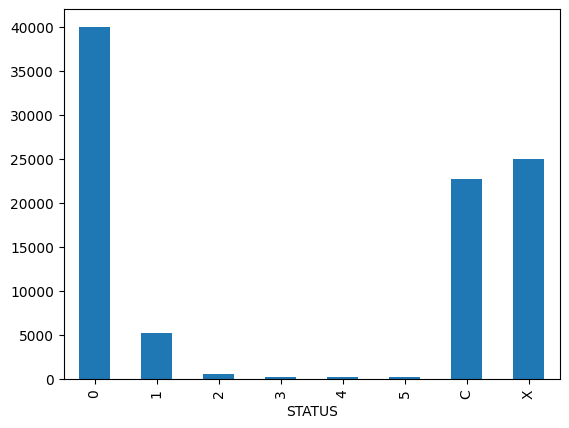

In [5]:
z=grouped.groupby('STATUS').count()
z.plot(kind='bar')

#most customer had past due record of 1-29 days (0)
#second high is customer without a balance - did not use the card (X)
#third high is customer paid off the balance that month (C)
#low presentage on delinquent (1-5) 

In [6]:
history=pd.get_dummies(data=df2,columns=['STATUS'],
                              prefix='',prefix_sep='').groupby('ID')[sorted(df2['STATUS'].unique().tolist())].sum()
history=history.rename(columns=
                      {'0':'pastdue',
                       '1':'30+',
                       '2':'60+',
                       '3':'90+',
                       '4':'120+',
                       '5':'150+',
                       'C':'paid_off',
                       'X':'no_usage',
                      })

overall_pastdue=['30+',	'60+',	'90+'	,'120+',	'150+']
history['number_of_months']=df2.groupby('ID')['MONTHS_BALANCE'].count()
history['over_90']=history[['90+','120+','150+']].sum(axis=1)
history['less_90']=history[['pastdue','30+','60+']].sum(axis=1)
history['overall_pastdue']=history[overall_pastdue].sum(axis=1)
history['pastdue_ratio']=round(history['pastdue']/ history['number_of_months'], 2)
history['overdue_ratio']=round(history['overall_pastdue']/ history['number_of_months'], 2)
history.head()

,pastdue,30+,60+,90+,120+,150+,paid_off,no_usage,number_of_months,over_90,less_90,overall_pastdue,pastdue_ratio,overdue_ratio
ID,,,,,,,,,,,,,,
5001711,3,0,0,0,0,0,0,1,4,0,3,0,0.75,0.0
5001712,10,0,0,0,0,0,9,0,19,0,10,0,0.53,0.0
5001713,0,0,0,0,0,0,0,22,22,0,0,0,0.00,0.0
5001714,0,0,0,0,0,0,0,15,15,0,0,0,0.00,0.0
5001715,0,0,0,0,0,0,0,60,60,0,0,0,0.00,0.0


In [7]:
history.sum()

pastdue              383120.00
30+                   11090.00
60+                     868.00
90+                     320.00
120+                    223.00
150+                   1693.00
paid_off             442031.00
no_usage             209230.00
number_of_months    1048575.00
over_90                2236.00
less_90              395078.00
overall_pastdue       14194.00
pastdue_ratio         21215.32
overdue_ratio           667.91
dtype: float64

In [8]:
history.head(20)

,pastdue,30+,60+,90+,120+,150+,paid_off,no_usage,number_of_months,over_90,less_90,overall_pastdue,pastdue_ratio,overdue_ratio
ID,,,,,,,,,,,,,,
5001711,3,0,0,0,0,0,0,1,4,0,3,0,0.75,0.00
5001712,10,0,0,0,0,0,9,0,19,0,10,0,0.53,0.00
5001713,0,0,0,0,0,0,0,22,22,0,0,0,0.00,0.00
5001714,0,0,0,0,0,0,0,15,15,0,0,0,0.00,0.00
5001715,0,0,0,0,0,0,0,60,60,0,0,0,0.00,0.00
5001717,17,0,0,0,0,0,5,0,22,0,17,0,0.77,0.00
5001718,24,2,0,0,0,0,3,10,39,0,26,2,0.62,0.05
5001719,2,0,0,0,0,0,41,0,43,0,2,0,0.05,0.00
5001720,29,7,0,0,0,0,0,0,36,0,36,7,0.81,0.19


In [9]:
#specify dependent variable 
target=[]
for index,row in history.iterrows() :
  if row['number_of_months'] < 6 :
    target.append(1)
  elif row['150+'] > 0 or (row['no_usage'] == row['number_of_months']) or (row['over_90'] > row['less_90']):
    target.append(0)
  elif row['pastdue_ratio'] > 0.70 and row['overall_pastdue'] >= 1 :
    target.append(0) 
  elif row['overdue_ratio'] > 0.10 and row['over_90'] >= 1 :
    target.append(0)
  else:
    target.append(1)

history['class']=target
history['class'].value_counts()

1    40200
0     5785
Name: class, dtype: int64

In [10]:
#unbalance set
history.describe()

,pastdue,30+,60+,90+,120+,150+,paid_off,no_usage,number_of_months,over_90,less_90,overall_pastdue,pastdue_ratio,overdue_ratio,class
count,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000,45985.000000
mean,8.331412,0.241166,0.018876,0.006959,0.004849,0.036816,9.612504,4.549962,22.802544,0.048625,8.591454,0.308666,0.461353,0.014525,0.874198
std,8.234128,0.990994,0.197607,0.101931,0.084188,0.855981,13.625156,9.622719,15.492771,0.935266,8.442478,1.512753,0.348173,0.061086,0.331630
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,10.000000,0.000000,3.000000,0.000000,0.150000,0.000000,1.000000
50%,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,19.000000,0.000000,6.000000,0.000000,0.410000,0.000000,1.000000
75%,11.000000,0.000000,0.000000,0.000000,0.000000,0.000000,16.000000,3.000000,34.000000,0.000000,12.000000,0.000000,0.800000,0.000000,1.000000
max,61.000000,38.000000,8.000000,8.000000,7.000000,48.000000,60.000000,61.000000,61.000000,48.000000,61.000000,49.000000,1.000000,1.000000,1.000000


In [11]:
df.duplicated().sum()

0

In [12]:
#merging 2 sets
#leave the ones constructed the class label out
features=['number_of_months','class']
new_features=history.loc[:,features]
mdf=pd.merge(df,new_features,on='ID')
mdf.index=mdf['ID']
mdf.drop('ID',axis=1, inplace=True)
mdf.drop_duplicates(inplace=True)
mdf.head()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,number_of_months,class
ID,,,,,,,,,,,,,,,,,,,
5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,16,1
5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,15,1
5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2.0,30,1
5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0,5,1
5008810,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0,27,1


In [13]:
mdf.duplicated().sum()

0

In [14]:
mdf.describe()

,CNT_CHILDREN,AMT_INCOME_TOTAL,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,number_of_months,class
count,28083.000000,2.808300e+04,28083.000000,28083.000000,28083.0,28083.000000,28083.000000,28083.000000,28083.000000,28083.000000,28083.000000
mean,0.428088,1.865543e+05,-15978.420325,59187.125450,1.0,0.226543,0.294199,0.091692,2.198269,22.603746,0.873803
std,0.748417,1.011737e+05,4202.054256,137584.177672,0.0,0.418602,0.455690,0.288596,0.915138,15.199870,0.332078
min,0.000000,2.700000e+04,-25152.000000,-15713.000000,1.0,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000
25%,0.000000,1.215000e+05,-19441.000000,-3153.000000,1.0,0.000000,0.000000,0.000000,2.000000,10.000000,1.000000
50%,0.000000,1.575000e+05,-15569.000000,-1539.000000,1.0,0.000000,0.000000,0.000000,2.000000,19.000000,1.000000
75%,1.000000,2.250000e+05,-12461.000000,-405.000000,1.0,0.000000,1.000000,0.000000,3.000000,33.000000,1.000000
max,19.000000,1.575000e+06,-7489.000000,365243.000000,1.0,1.000000,1.000000,1.000000,20.000000,61.000000,1.000000


In [15]:
mdf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28083 entries, 5008804 to 5150337
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   CODE_GENDER          28083 non-null  object 
 1   FLAG_OWN_CAR         28083 non-null  object 
 2   FLAG_OWN_REALTY      28083 non-null  object 
 3   CNT_CHILDREN         28083 non-null  int64  
 4   AMT_INCOME_TOTAL     28083 non-null  float64
 5   NAME_INCOME_TYPE     28083 non-null  object 
 6   NAME_EDUCATION_TYPE  28083 non-null  object 
 7   NAME_FAMILY_STATUS   28083 non-null  object 
 8   NAME_HOUSING_TYPE    28083 non-null  object 
 9   DAYS_BIRTH           28083 non-null  int64  
 10  DAYS_EMPLOYED        28083 non-null  int64  
 11  FLAG_MOBIL           28083 non-null  int64  
 12  FLAG_WORK_PHONE      28083 non-null  int64  
 13  FLAG_PHONE           28083 non-null  int64  
 14  FLAG_EMAIL           28083 non-null  int64  
 15  OCCUPATION_TYPE      19475 n

In [16]:
mdf.corr()

,CNT_CHILDREN,AMT_INCOME_TOTAL,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,number_of_months,class
CNT_CHILDREN,1.000000,0.029119,0.334121,-0.227424,NaN,0.042909,-0.022226,0.011322,0.890447,-0.007517,-0.009293
AMT_INCOME_TOTAL,0.029119,1.000000,0.065492,-0.168659,NaN,-0.032765,0.020283,0.090552,0.020743,0.022562,-0.038029
DAYS_BIRTH,0.334121,0.065492,1.000000,-0.614483,NaN,0.182343,-0.029467,0.104355,0.297257,-0.061375,-0.011624
DAYS_EMPLOYED,-0.227424,-0.168659,-0.614483,1.000000,NaN,-0.243377,-0.006729,-0.084019,-0.219954,-0.005415,0.013575
FLAG_MOBIL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
FLAG_WORK_PHONE,0.042909,-0.032765,0.182343,-0.243377,NaN,1.000000,0.304161,-0.034001,0.058527,0.016443,-0.002852
FLAG_PHONE,-0.022226,0.020283,-0.029467,-0.006729,NaN,0.304161,1.000000,0.012574,-0.012817,0.016055,-0.013262
FLAG_EMAIL,0.011322,0.090552,0.104355,-0.084019,NaN,-0.034001,0.012574,1.000000,0.008017,0.005166,-0.004846
CNT_FAM_MEMBERS,0.890447,0.020743,0.297257,-0.219954,NaN,0.058527,-0.012817,0.008017,1.000000,0.010635,-0.008476
number_of_months,-0.007517,0.022562,-0.061375,-0.005415,NaN,0.016443,0.016055,0.005166,0.010635,1.000000,-0.029266


In [17]:
profile = ProfileReport(mdf)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [18]:
#split the merged set into features and label
y = mdf['class']
x = mdf.drop(columns=['class'],axis=1)
x

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,number_of_months
ID,,,,,,,,,,,,,,,,,,
5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,16
5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,15
5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2.0,30
5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0,5
5008810,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0,27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5149828,M,Y,Y,0,315000.0,Working,Secondary / secondary special,Married,House / apartment,-17348,-2420,1,0,0,0,Managers,2.0,12
5149834,F,N,Y,0,157500.0,Commercial associate,Higher education,Married,House / apartment,-12387,-1325,1,0,1,1,Medicine staff,2.0,24
5149838,F,N,Y,0,157500.0,Pensioner,Higher education,Married,House / apartment,-12387,-1325,1,0,1,1,Medicine staff,2.0,33


In [19]:
#split data into 70/30 training and testing sets
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=0)

In [20]:
#preprocess - drop constant value
x_train=x_train.drop(['FLAG_MOBIL'],axis=1)

In [21]:
#preprocess - missing value
x_train['OCCUPATION_TYPE'].fillna('Other',inplace=True)

In [22]:
#preprocess - change applicant days of birth and employment into years
x_train['AGE']=-(x_train['DAYS_BIRTH'])//365
x_train['TENURE'] =-(x_train['DAYS_EMPLOYED'])//365
x_train['TENURE']= x_train['TENURE'].replace(-1001,-1)
x_train.drop(['DAYS_BIRTH','DAYS_EMPLOYED'],axis = 1,inplace=True)

In [23]:
#adjusting datatype for encoding
x_train['AMT_INCOME_TOTAL']=x_train['AMT_INCOME_TOTAL'].astype('int64')
x_train['FLAG_WORK_PHONE']=x_train['FLAG_WORK_PHONE'].astype('object')
x_train['FLAG_PHONE']=x_train['FLAG_PHONE'].astype('object')
x_train['FLAG_EMAIL']=x_train['FLAG_EMAIL'].astype('object')
x_train['CNT_FAM_MEMBERS']=x_train['CNT_FAM_MEMBERS'].astype('int64')


In [24]:
cat_train=x_train.select_dtypes('object')
cat_train.nunique()

CODE_GENDER             2
FLAG_OWN_CAR            2
FLAG_OWN_REALTY         2
NAME_INCOME_TYPE        5
NAME_EDUCATION_TYPE     5
NAME_FAMILY_STATUS      5
NAME_HOUSING_TYPE       6
FLAG_WORK_PHONE         2
FLAG_PHONE              2
FLAG_EMAIL              2
OCCUPATION_TYPE        19
dtype: int64

In [25]:
#since occupation type is high cardinality, use target encoding
from category_encoders import MEstimateEncoder
target=MEstimateEncoder(m=7,cols=['OCCUPATION_TYPE'])
# train with 25% of the data to prevent overfitting 
x_encode=x_train.sample(frac=0.25)
y_encode=y_train[x_encode.index]
target.fit(x_encode,y_encode)
x_encoded=target.transform(x_train)
x_encoded['OCCUPATION_TYPE'].unique()


array([0.88880587, 0.87204953, 0.87096831, 0.89288779, 0.846674  ,
       0.8503795 , 0.8587587 , 0.8960114 , 0.85602112, 0.84527923,
       0.83871013, 0.84720348, 0.85337348, 0.85041474, 0.80957633,
       0.85579018, 0.94687448, 0.85543949, 0.88105413])

In [26]:
x_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19658 entries, 5062560 to 5023184
Data columns (total 17 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   CODE_GENDER          19658 non-null  object 
 1   FLAG_OWN_CAR         19658 non-null  object 
 2   FLAG_OWN_REALTY      19658 non-null  object 
 3   CNT_CHILDREN         19658 non-null  int64  
 4   AMT_INCOME_TOTAL     19658 non-null  int64  
 5   NAME_INCOME_TYPE     19658 non-null  object 
 6   NAME_EDUCATION_TYPE  19658 non-null  object 
 7   NAME_FAMILY_STATUS   19658 non-null  object 
 8   NAME_HOUSING_TYPE    19658 non-null  object 
 9   FLAG_WORK_PHONE      19658 non-null  object 
 10  FLAG_PHONE           19658 non-null  object 
 11  FLAG_EMAIL           19658 non-null  object 
 12  OCCUPATION_TYPE      19658 non-null  float64
 13  CNT_FAM_MEMBERS      19658 non-null  int64  
 14  number_of_months     19658 non-null  int64  
 15  AGE                  19658 n

In [27]:
#one-hot encoding for the rest of categorical features
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for x in x_encoded:
    if x_encoded[x].dtypes=='object':
        x_encoded[x] = le.fit_transform(x_encoded[x])

In [28]:
x_encoded.head()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,number_of_months,AGE,TENURE
ID,,,,,,,,,,,,,,,,,
5062560,0,0,0,0,180000,4,4,4,1,0,0,0,0.888806,1,28,66,11
5099798,1,1,1,2,135000,4,4,1,1,1,1,0,0.888806,4,25,38,6
5009209,0,0,0,0,292500,2,4,1,1,1,1,0,0.872050,2,46,57,23
5112996,0,0,1,0,135000,1,4,3,1,0,0,0,0.888806,1,7,64,-1
5036639,0,0,1,0,126000,2,1,1,1,0,1,0,0.888806,2,47,43,18


In [29]:
y_index = x_encoded.index
y_encoded = y_train.loc[y_index]

In [30]:
#balancing the dataset
from imblearn.over_sampling import SMOTE
oversample = SMOTE()
x_smoted, y_smoted = oversample.fit_resample(x_encoded,y_encoded)
y_smoted = pd.Series(y_smoted)
y_smoted.value_counts()


1    17154
0    17154
Name: class, dtype: int64

In [31]:
x_smoted.describe()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,number_of_months,AGE,TENURE
count,34308.000000,34308.000000,34308.000000,34308.000000,3.430800e+04,34308.000000,34308.000000,34308.000000,34308.000000,34308.000000,34308.00000,34308.000000,34308.000000,34308.000000,34308.000000,34308.000000,34308.000000
mean,0.256791,0.298298,0.569051,0.352425,1.909543e+05,2.334762,3.036085,1.261776,1.244783,0.163927,0.21613,0.059170,0.870919,2.090066,22.756121,42.766439,5.269791
std,0.436870,0.457518,0.495216,0.689837,1.039655e+05,1.673901,1.300118,0.867366,0.868950,0.370215,0.41161,0.235946,0.019320,0.877153,14.392477,11.148368,6.232036
min,0.000000,0.000000,0.000000,0.000000,2.700000e+04,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.809576,1.000000,1.000000,20.000000,-1.000000
25%,0.000000,0.000000,0.000000,0.000000,1.260000e+05,1.000000,1.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.850415,2.000000,11.000000,34.000000,1.000000
50%,0.000000,0.000000,1.000000,0.000000,1.665000e+05,3.000000,4.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.872050,2.000000,20.000000,41.000000,4.000000
75%,1.000000,1.000000,1.000000,1.000000,2.250000e+05,4.000000,4.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.888806,2.000000,32.000000,51.000000,8.000000
max,1.000000,1.000000,1.000000,19.000000,1.575000e+06,4.000000,4.000000,4.000000,5.000000,1.000000,1.00000,1.000000,0.946874,20.000000,61.000000,68.000000,42.000000


In [32]:
# normalization
norm_train=(x_smoted-x_smoted.min())/(x_smoted.max()-x_smoted.min())
print(norm_train)

       CODE_GENDER  FLAG_OWN_CAR  FLAG_OWN_REALTY  CNT_CHILDREN  \
0              0.0           0.0              0.0      0.000000   
1              1.0           1.0              1.0      0.105263   
2              0.0           0.0              0.0      0.000000   
3              0.0           0.0              1.0      0.000000   
4              0.0           0.0              1.0      0.000000   
...            ...           ...              ...           ...   
34303          0.0           0.0              1.0      0.000000   
34304          0.0           1.0              1.0      0.000000   
34305          0.0           0.0              0.0      0.000000   
34306          1.0           1.0              0.0      0.000000   
34307          0.0           0.0              0.0      0.000000   

       AMT_INCOME_TOTAL  NAME_INCOME_TYPE  NAME_EDUCATION_TYPE  \
0              0.098837              1.00                 1.00   
1              0.069767              1.00                 1.00 

In [33]:
norm_train.describe()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,number_of_months,AGE,TENURE
count,34308.000000,34308.000000,34308.000000,34308.000000,34308.000000,34308.000000,34308.000000,34308.000000,34308.000000,34308.000000,34308.00000,34308.000000,34308.000000,34308.000000,34308.000000,34308.000000,34308.000000
mean,0.256791,0.298298,0.569051,0.018549,0.105914,0.583690,0.759021,0.315444,0.248957,0.163927,0.21613,0.059170,0.446781,0.057372,0.362602,0.474301,0.145809
std,0.436870,0.457518,0.495216,0.036307,0.067161,0.418475,0.325029,0.216842,0.173790,0.370215,0.41161,0.235946,0.140716,0.046166,0.239875,0.232258,0.144931
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.063953,0.250000,0.250000,0.250000,0.200000,0.000000,0.00000,0.000000,0.297443,0.052632,0.166667,0.291667,0.046512
50%,0.000000,0.000000,1.000000,0.000000,0.090116,0.750000,1.000000,0.250000,0.200000,0.000000,0.00000,0.000000,0.455019,0.052632,0.316667,0.437500,0.116279
75%,1.000000,1.000000,1.000000,0.052632,0.127907,1.000000,1.000000,0.250000,0.200000,0.000000,0.00000,0.000000,0.577062,0.052632,0.516667,0.645833,0.209302
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [34]:
norm_train.skew()

CODE_GENDER            1.113480
FLAG_OWN_CAR           0.881776
FLAG_OWN_REALTY       -0.278888
CNT_CHILDREN           3.615537
AMT_INCOME_TOTAL       2.553319
NAME_INCOME_TYPE      -0.237993
NAME_EDUCATION_TYPE   -0.754905
NAME_FAMILY_STATUS     1.348212
NAME_HOUSING_TYPE      3.482015
FLAG_WORK_PHONE        1.815665
FLAG_PHONE             1.379393
FLAG_EMAIL             3.736925
OCCUPATION_TYPE       -0.141639
CNT_FAM_MEMBERS        1.637669
number_of_months       0.668917
AGE                    0.241438
TENURE                 1.724801
dtype: float64

In [35]:
norm_train.corr()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,number_of_months,AGE,TENURE
CODE_GENDER,1.000000,0.375667,-0.002740,0.084450,0.179788,0.110761,0.013245,-0.039250,0.069065,0.093681,0.023325,0.030177,-0.025418,0.114518,-0.003349,-0.180469,-0.023488
FLAG_OWN_CAR,0.375667,1.000000,0.052147,0.109467,0.213479,0.053630,-0.073569,-0.071838,0.020082,0.074063,0.038096,0.058988,-0.090511,0.154582,0.018666,-0.130895,0.014291
FLAG_OWN_REALTY,-0.002740,0.052147,1.000000,0.041605,0.046542,-0.042778,0.025557,0.053023,-0.145831,-0.128677,-0.006937,0.073050,0.051867,0.035876,-0.032626,0.148755,0.007536
CNT_CHILDREN,0.084450,0.109467,0.041605,1.000000,0.011937,0.104087,-0.022663,-0.123647,0.019564,0.067221,0.014553,0.038965,-0.081150,0.868351,0.004597,-0.283293,0.036714
AMT_INCOME_TOTAL,0.179788,0.213479,0.046542,0.011937,1.000000,-0.084567,-0.243125,0.003410,-0.026495,-0.049610,0.005717,0.066037,-0.138931,-0.001419,0.013736,-0.058375,0.059122
NAME_INCOME_TYPE,0.110761,0.053630,-0.042778,0.104087,-0.084567,1.000000,0.087295,-0.038396,0.040334,0.146768,0.018815,-0.012367,-0.097417,0.112178,-0.009913,-0.212809,0.188297
NAME_EDUCATION_TYPE,0.013245,-0.073569,0.025557,-0.022663,-0.243125,0.087295,1.000000,0.011914,-0.028821,0.001760,-0.025686,-0.077657,0.119586,-0.011975,-0.003888,0.172750,-0.003608
NAME_FAMILY_STATUS,-0.039250,-0.071838,0.053023,-0.123647,0.003410,-0.038396,0.011914,1.000000,0.016924,-0.024076,0.026856,0.018031,0.077245,-0.470166,-0.019741,0.101521,-0.050646
NAME_HOUSING_TYPE,0.069065,0.020082,-0.145831,0.019564,-0.026495,0.040334,-0.028821,0.016924,1.000000,0.059198,0.003907,0.027452,-0.034133,0.003083,-0.046017,-0.205150,-0.020049
FLAG_WORK_PHONE,0.093681,0.074063,-0.128677,0.067221,-0.049610,0.146768,0.001760,-0.024076,0.059198,1.000000,0.307485,0.003080,-0.085020,0.091868,0.024785,-0.147057,0.086917


In [36]:
norm_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34308 entries, 0 to 34307
Data columns (total 17 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   CODE_GENDER          34308 non-null  float64
 1   FLAG_OWN_CAR         34308 non-null  float64
 2   FLAG_OWN_REALTY      34308 non-null  float64
 3   CNT_CHILDREN         34308 non-null  float64
 4   AMT_INCOME_TOTAL     34308 non-null  float64
 5   NAME_INCOME_TYPE     34308 non-null  float64
 6   NAME_EDUCATION_TYPE  34308 non-null  float64
 7   NAME_FAMILY_STATUS   34308 non-null  float64
 8   NAME_HOUSING_TYPE    34308 non-null  float64
 9   FLAG_WORK_PHONE      34308 non-null  float64
 10  FLAG_PHONE           34308 non-null  float64
 11  FLAG_EMAIL           34308 non-null  float64
 12  OCCUPATION_TYPE      34308 non-null  float64
 13  CNT_FAM_MEMBERS      34308 non-null  float64
 14  number_of_months     34308 non-null  float64
 15  AGE                  34308 non-null 

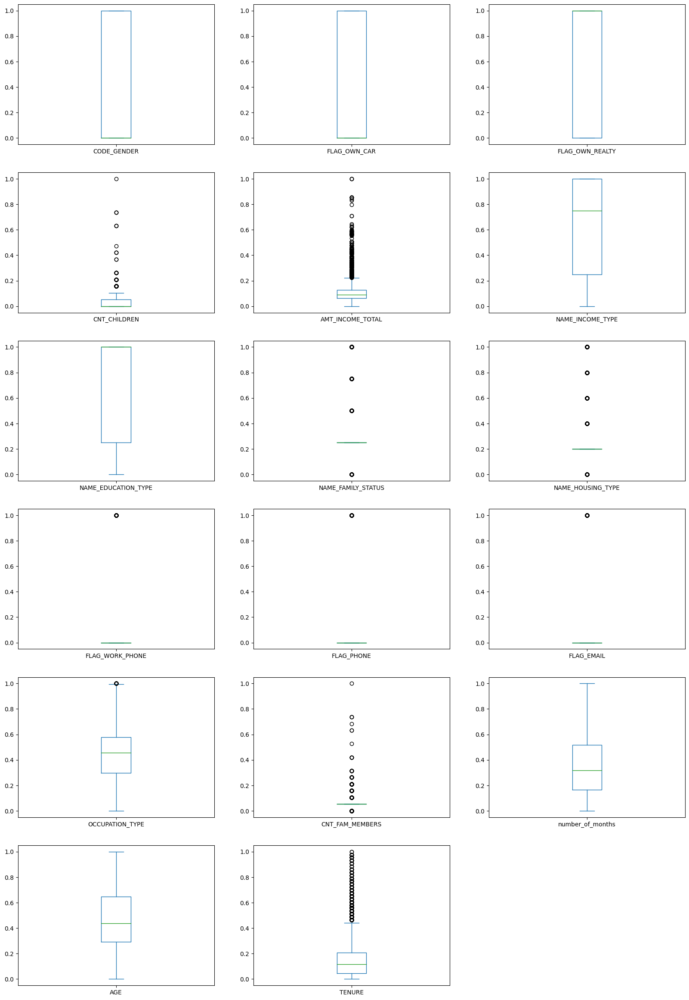

In [37]:
norm_train.plot(kind='box', subplots=True, layout=(12,3), sharex=True, sharey=False, figsize=(20, 60))
plt.show()

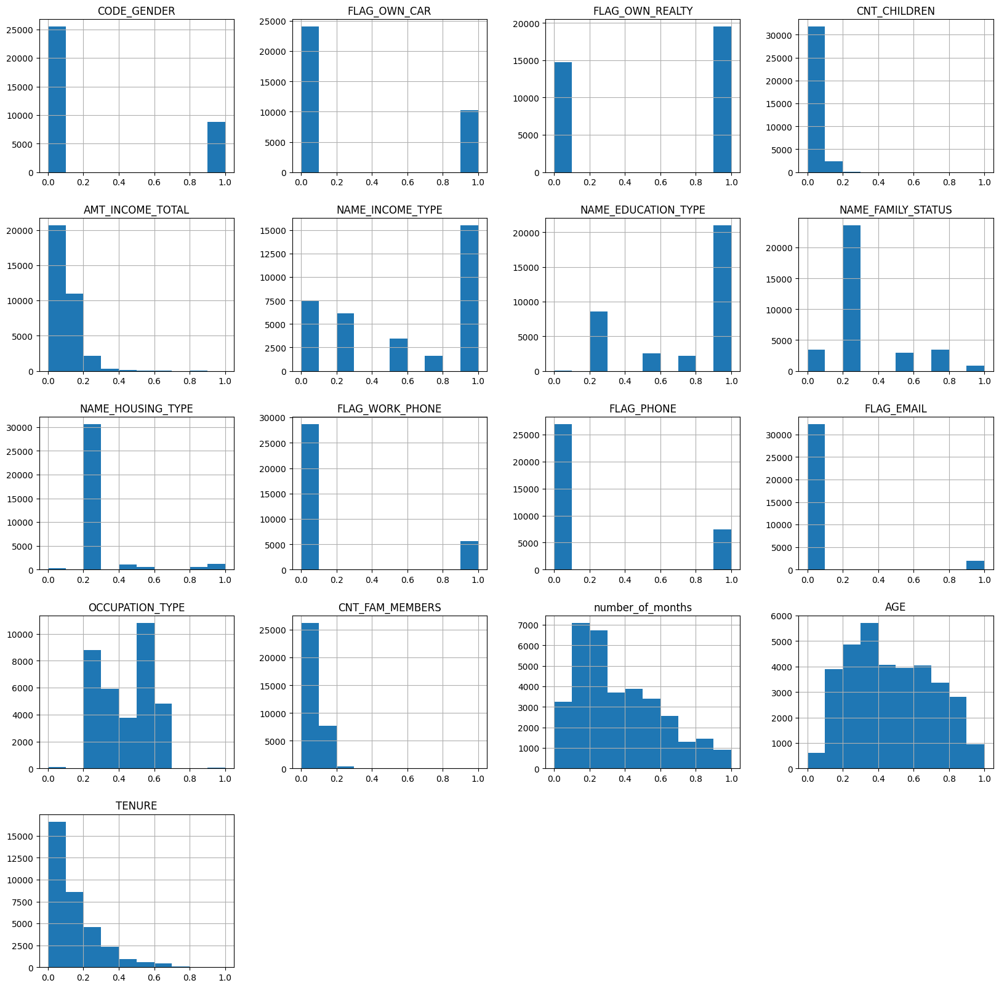

In [38]:
norm_train.hist(figsize=(20, 20))
plt.show()

In [39]:
# create a copy of the label and the features
label = y_smoted.copy()
features = norm_train.copy()

# Remove outliers using the Z-Score method
z_scores = np.abs(stats.zscore(features))
features = features[(z_scores < 3).all(axis=1)]

# Get the cleaned feature indices
cleaned_feature_indices = features.index

# Combine the target with the cleaned feature index
y_smoted = label.loc[cleaned_feature_indices]
features.reset_index()

# Print the number of rows in the dataframe before and after Z-Score outlier removal
print("PRE Z-SCORE OUTLIER REMOVAL ROWS: {}".format(norm_train.shape[0]))
print("POST Z-SCORE OUTLIER REMOVAL ROWS: {}".format(features.shape[0]))

PRE Z-SCORE OUTLIER REMOVAL ROWS: 34308
POST Z-SCORE OUTLIER REMOVAL ROWS: 28291


In [40]:
features.corr()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,number_of_months,AGE,TENURE
CODE_GENDER,1.000000,0.379421,0.010294,0.086641,0.190065,0.119542,0.026557,-0.001510,0.014381,0.093833,0.028145,NaN,-0.021917,0.110250,-0.004074,-0.166568,0.010548
FLAG_OWN_CAR,0.379421,1.000000,0.055970,0.109495,0.192998,0.061679,-0.060219,-0.054001,-0.021174,0.082185,0.038074,NaN,-0.096710,0.157400,0.017388,-0.120562,0.053278
FLAG_OWN_REALTY,0.010294,0.055970,1.000000,0.036032,0.026955,-0.034984,0.031740,0.038249,-0.108781,-0.111923,-0.004628,NaN,0.059232,0.037109,-0.041252,0.150341,-0.009457
CNT_CHILDREN,0.086641,0.109495,0.036032,1.000000,0.001434,0.108188,-0.034588,-0.112790,0.009456,0.088474,0.026288,NaN,-0.093246,0.841023,0.006514,-0.324558,0.078845
AMT_INCOME_TOTAL,0.190065,0.192998,0.026955,0.001434,1.000000,-0.046739,-0.255041,0.025119,0.007988,-0.059164,-0.010933,NaN,-0.158202,-0.021978,0.020033,-0.103455,0.113513
NAME_INCOME_TYPE,0.119542,0.061679,-0.034984,0.108188,-0.046739,1.000000,0.067063,-0.029832,-0.001444,0.150064,0.024419,NaN,-0.107185,0.110758,-0.015509,-0.230285,0.195025
NAME_EDUCATION_TYPE,0.026557,-0.060219,0.031740,-0.034588,-0.255041,0.067063,1.000000,-0.010543,-0.006976,0.012275,-0.019669,NaN,0.130353,-0.013176,-0.008414,0.160553,-0.024351
NAME_FAMILY_STATUS,-0.001510,-0.054001,0.038249,-0.112790,0.025119,-0.029832,-0.010543,1.000000,-0.007653,-0.011649,0.008861,NaN,0.054789,-0.474350,-0.014645,0.025843,-0.058373
NAME_HOUSING_TYPE,0.014381,-0.021174,-0.108781,0.009456,0.007988,-0.001444,-0.006976,-0.007653,1.000000,-0.004040,-0.020998,NaN,-0.021556,-0.004156,-0.009684,-0.084298,0.002939
FLAG_WORK_PHONE,0.093833,0.082185,-0.111923,0.088474,-0.059164,0.150064,0.012275,-0.011649,-0.004040,1.000000,0.310662,NaN,-0.075105,0.110165,0.027754,-0.148546,0.098261


In [41]:
features.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28291 entries, 1 to 34307
Data columns (total 17 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   CODE_GENDER          28291 non-null  float64
 1   FLAG_OWN_CAR         28291 non-null  float64
 2   FLAG_OWN_REALTY      28291 non-null  float64
 3   CNT_CHILDREN         28291 non-null  float64
 4   AMT_INCOME_TOTAL     28291 non-null  float64
 5   NAME_INCOME_TYPE     28291 non-null  float64
 6   NAME_EDUCATION_TYPE  28291 non-null  float64
 7   NAME_FAMILY_STATUS   28291 non-null  float64
 8   NAME_HOUSING_TYPE    28291 non-null  float64
 9   FLAG_WORK_PHONE      28291 non-null  float64
 10  FLAG_PHONE           28291 non-null  float64
 11  FLAG_EMAIL           28291 non-null  float64
 12  OCCUPATION_TYPE      28291 non-null  float64
 13  CNT_FAM_MEMBERS      28291 non-null  float64
 14  number_of_months     28291 non-null  float64
 15  AGE                  28291 non-null 

In [42]:
#dropping features which construct the depandent variable 'class' 
#also dropping the CNT_CHILDREN as highly correlated to CNT_FAM_MEMBER
processed_train = features.drop(['CNT_CHILDREN'], axis=1)

In [43]:
#filter method - Chi-Squared
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2


In [44]:
#feature extraction
test = SelectKBest(score_func=chi2, k= 10)
fit = test.fit(processed_train, y_smoted)

In [45]:
#summarize scores
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(processed_train.columns)

In [46]:
#summarize selected features
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Feature','Chi_Score'] 
print(featureScores.nlargest(30,'Chi_Score')) 

                Feature   Chi_Score
9            FLAG_PHONE  829.107069
8       FLAG_WORK_PHONE  788.706352
0           CODE_GENDER  744.647404
1          FLAG_OWN_CAR  669.025989
2       FLAG_OWN_REALTY  519.824896
5   NAME_EDUCATION_TYPE   22.661957
12      CNT_FAM_MEMBERS   19.404067
4      NAME_INCOME_TYPE   18.949485
6    NAME_FAMILY_STATUS   18.785258
14                  AGE    9.402185
11      OCCUPATION_TYPE    3.740536
13     number_of_months    3.730506
3      AMT_INCOME_TOTAL    3.273290
7     NAME_HOUSING_TYPE    0.955624
15               TENURE    0.391540
10           FLAG_EMAIL         NaN


In [47]:
#wrapper method - RFE
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

In [48]:
# Feature extraction
model = LogisticRegression(solver='liblinear')
rfe = RFE(model, n_features_to_select=10)
fit = rfe.fit(processed_train, y_smoted)
print("Num Feature: %s" % (fit.n_features_))

Num Feature: 10


In [49]:
selected = pd.DataFrame(fit.support_)
dfcolumns = pd.DataFrame(processed_train.columns)
rankings = pd.DataFrame(fit.ranking_)
choosenwrap = pd.concat([dfcolumns,selected,rankings],axis=1)
choosenwrap.columns = ['Feature','RFE_Selected','RFE_Ranks'] 
print(choosenwrap.nlargest(30,'RFE_Ranks')) 

                Feature  RFE_Selected  RFE_Ranks
10           FLAG_EMAIL         False          7
4      NAME_INCOME_TYPE         False          6
7     NAME_HOUSING_TYPE         False          5
15               TENURE         False          4
13     number_of_months         False          3
5   NAME_EDUCATION_TYPE         False          2
0           CODE_GENDER          True          1
1          FLAG_OWN_CAR          True          1
2       FLAG_OWN_REALTY          True          1
3      AMT_INCOME_TOTAL          True          1
6    NAME_FAMILY_STATUS          True          1
8       FLAG_WORK_PHONE          True          1
9            FLAG_PHONE          True          1
11      OCCUPATION_TYPE          True          1
12      CNT_FAM_MEMBERS          True          1
14                  AGE          True          1


In [50]:
#extra trees forest
from sklearn.ensemble import ExtraTreesClassifier
model = ExtraTreesClassifier(n_estimators=14)
model.fit(processed_train, y_smoted)
feature_importances = pd.DataFrame(model.feature_importances_)
featuretree = pd.concat([dfcolumns,feature_importances],axis=1)
featuretree.columns = ['Feature','XTree_Classifier'] 
print(featuretree.nlargest(30,'XTree_Classifier'))

                Feature  XTree_Classifier
13     number_of_months          0.175049
3      AMT_INCOME_TOTAL          0.115397
14                  AGE          0.112485
11      OCCUPATION_TYPE          0.101973
15               TENURE          0.087503
5   NAME_EDUCATION_TYPE          0.060580
4      NAME_INCOME_TYPE          0.057313
6    NAME_FAMILY_STATUS          0.053518
12      CNT_FAM_MEMBERS          0.053267
2       FLAG_OWN_REALTY          0.044298
9            FLAG_PHONE          0.033284
0           CODE_GENDER          0.032609
8       FLAG_WORK_PHONE          0.028334
1          FLAG_OWN_CAR          0.028109
7     NAME_HOUSING_TYPE          0.016281
10           FLAG_EMAIL          0.000000


In [51]:
dff=pd.merge(featureScores, choosenwrap, on=["Feature"])
feature_selection_df = pd.merge(dff, featuretree, on=["Feature"])
feature_selection_df.sort_values(by="XTree_Classifier",ascending=False)

,Feature,Chi_Score,RFE_Selected,RFE_Ranks,XTree_Classifier
13,number_of_months,3.730506,False,3,0.175049
3,AMT_INCOME_TOTAL,3.273290,True,1,0.115397
14,AGE,9.402185,True,1,0.112485
11,OCCUPATION_TYPE,3.740536,True,1,0.101973
15,TENURE,0.391540,False,4,0.087503
5,NAME_EDUCATION_TYPE,22.661957,False,2,0.060580
4,NAME_INCOME_TYPE,18.949485,False,6,0.057313
6,NAME_FAMILY_STATUS,18.785258,True,1,0.053518
12,CNT_FAM_MEMBERS,19.404067,True,1,0.053267
2,FLAG_OWN_REALTY,519.824896,True,1,0.044298


In [52]:
#dropping features used in modeling were selected according to feature selection methods
processed_train = processed_train.drop(['FLAG_EMAIL','NAME_HOUSING_TYPE'], axis=1)

In [53]:
processed_train.corr()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,FLAG_WORK_PHONE,FLAG_PHONE,OCCUPATION_TYPE,CNT_FAM_MEMBERS,number_of_months,AGE,TENURE
CODE_GENDER,1.000000,0.379421,0.010294,0.190065,0.119542,0.026557,-0.001510,0.093833,0.028145,-0.021917,0.110250,-0.004074,-0.166568,0.010548
FLAG_OWN_CAR,0.379421,1.000000,0.055970,0.192998,0.061679,-0.060219,-0.054001,0.082185,0.038074,-0.096710,0.157400,0.017388,-0.120562,0.053278
FLAG_OWN_REALTY,0.010294,0.055970,1.000000,0.026955,-0.034984,0.031740,0.038249,-0.111923,-0.004628,0.059232,0.037109,-0.041252,0.150341,-0.009457
AMT_INCOME_TOTAL,0.190065,0.192998,0.026955,1.000000,-0.046739,-0.255041,0.025119,-0.059164,-0.010933,-0.158202,-0.021978,0.020033,-0.103455,0.113513
NAME_INCOME_TYPE,0.119542,0.061679,-0.034984,-0.046739,1.000000,0.067063,-0.029832,0.150064,0.024419,-0.107185,0.110758,-0.015509,-0.230285,0.195025
NAME_EDUCATION_TYPE,0.026557,-0.060219,0.031740,-0.255041,0.067063,1.000000,-0.010543,0.012275,-0.019669,0.130353,-0.013176,-0.008414,0.160553,-0.024351
NAME_FAMILY_STATUS,-0.001510,-0.054001,0.038249,0.025119,-0.029832,-0.010543,1.000000,-0.011649,0.008861,0.054789,-0.474350,-0.014645,0.025843,-0.058373
FLAG_WORK_PHONE,0.093833,0.082185,-0.111923,-0.059164,0.150064,0.012275,-0.011649,1.000000,0.310662,-0.075105,0.110165,0.027754,-0.148546,0.098261
FLAG_PHONE,0.028145,0.038074,-0.004628,-0.010933,0.024419,-0.019669,0.008861,0.310662,1.000000,-0.014321,0.044875,0.010226,0.029861,0.022093
OCCUPATION_TYPE,-0.021917,-0.096710,0.059232,-0.158202,-0.107185,0.130353,0.054789,-0.075105,-0.014321,1.000000,-0.099314,-0.018748,0.288355,-0.153062


In [54]:
processed_train.skew()

CODE_GENDER            1.128375
FLAG_OWN_CAR           0.937487
FLAG_OWN_REALTY       -0.254786
AMT_INCOME_TOTAL       0.946722
NAME_INCOME_TYPE      -0.223246
NAME_EDUCATION_TYPE   -0.794758
NAME_FAMILY_STATUS     1.146499
FLAG_WORK_PHONE        1.862346
FLAG_PHONE             1.447295
OCCUPATION_TYPE       -0.200683
CNT_FAM_MEMBERS        0.623162
number_of_months       0.661589
AGE                    0.247098
TENURE                 1.190940
dtype: float64

In [55]:
processed_train.describe()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,FLAG_WORK_PHONE,FLAG_PHONE,OCCUPATION_TYPE,CNT_FAM_MEMBERS,number_of_months,AGE,TENURE
count,28291.000000,28291.000000,28291.000000,28291.000000,28291.000000,28291.000000,28291.000000,28291.000000,28291.000000,28291.000000,28291.000000,28291.000000,28291.000000,28291.000000
mean,0.254321,0.287795,0.563183,0.100872,0.582827,0.764969,0.293247,0.159273,0.206886,0.448387,0.056678,0.365647,0.478882,0.135109
std,0.435487,0.452743,0.496001,0.053248,0.414403,0.321062,0.183428,0.365937,0.405080,0.137172,0.041146,0.240069,0.229648,0.123352
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.035265,0.000000,0.000000,0.020833,0.000000
25%,0.000000,0.000000,0.000000,0.061047,0.250000,0.500000,0.250000,0.000000,0.000000,0.297443,0.052632,0.166667,0.291667,0.046512
50%,0.000000,0.000000,1.000000,0.084302,0.500000,1.000000,0.250000,0.000000,0.000000,0.455019,0.052632,0.316667,0.458333,0.116279
75%,1.000000,1.000000,1.000000,0.127907,1.000000,1.000000,0.250000,0.000000,0.000000,0.577062,0.052632,0.533333,0.666667,0.209302
max,1.000000,1.000000,1.000000,0.305594,1.000000,1.000000,0.750000,1.000000,1.000000,0.868540,0.157895,1.000000,1.000000,0.558140


In [56]:
#prepare test dataset
x_test=x_test.drop(['FLAG_MOBIL'],axis=1)
#convert days to years 
x_test['AGE']=(x_test['DAYS_BIRTH']/365)*-1
x_test['AGE']=x_test['AGE'].apply(lambda v : int(v))
x_test['TENURE']=x_test['DAYS_EMPLOYED']/365
x_test['TENURE']=x_test['TENURE'].apply(lambda v : int(v*-1) if v <0 else 0)
x_test=x_test.drop(columns=['DAYS_BIRTH','DAYS_EMPLOYED'])
#missing values
x_test['OCCUPATION_TYPE'].fillna('Other',inplace=True)
#target encoding
x_test_encoded=target.transform(x_test)
#one-hot encoding
for x in x_test_encoded:
    if x_test_encoded[x].dtypes=='object':
        x_test_encoded[x] = le.fit_transform(x_test_encoded[x])
x_test_encoded=x_test_encoded.drop(['CNT_CHILDREN','FLAG_EMAIL','NAME_HOUSING_TYPE'],axis=1)
norm_test=(x_test_encoded-x_test_encoded.min())/(x_test_encoded.max()-x_test_encoded.min())

In [57]:
x_train = processed_train.copy()
y_train = y_smoted.copy()
x_test = norm_test.copy()

In [58]:
x_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28291 entries, 1 to 34307
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   CODE_GENDER          28291 non-null  float64
 1   FLAG_OWN_CAR         28291 non-null  float64
 2   FLAG_OWN_REALTY      28291 non-null  float64
 3   AMT_INCOME_TOTAL     28291 non-null  float64
 4   NAME_INCOME_TYPE     28291 non-null  float64
 5   NAME_EDUCATION_TYPE  28291 non-null  float64
 6   NAME_FAMILY_STATUS   28291 non-null  float64
 7   FLAG_WORK_PHONE      28291 non-null  float64
 8   FLAG_PHONE           28291 non-null  float64
 9   OCCUPATION_TYPE      28291 non-null  float64
 10  CNT_FAM_MEMBERS      28291 non-null  float64
 11  number_of_months     28291 non-null  float64
 12  AGE                  28291 non-null  float64
 13  TENURE               28291 non-null  float64
dtypes: float64(14)
memory usage: 3.2 MB


In [59]:
#modeling - Logistic Regression, K-Nearest Neighbors, Support Vector Machine (SVM), Decision Tree, Random Forest
from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix,precision_score,recall_score,roc_auc_score,f1_score,roc_curve
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import ConfusionMatrixDisplay, precision_recall_curve

Train accuracy score = 0.80902
Train precision score = 0.79702
Train recall score = 0.7882
Train F1 score = 0.79258
Train AUC score = 0.80758
Test accuracy score = 0.81389
Test precision score = 0.87837
Test recall score = 0.91429
Test F1 score = 0.89597
Test AUC score = 0.50762
     0     1
0  105   935
1  633  6752


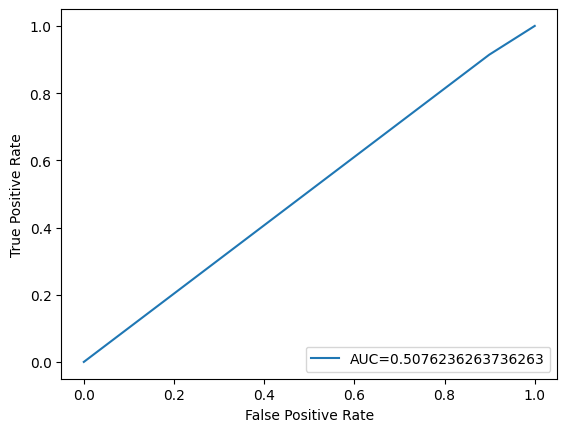

In [60]:
model=svm.NuSVC()
model.fit(x_train,y_train)
#calculate train accuracy 
y_train_pred=model.predict(x_train)
print('Train accuracy score = {:.5}'.format(accuracy_score(y_train,y_train_pred)))
print('Train precision score = {:.5}'.format(precision_score(y_train,y_train_pred)))
print('Train recall score = {:.5}'.format(recall_score(y_train,y_train_pred)))
print('Train F1 score = {:.5}'.format(f1_score(y_train,y_train_pred)))
print('Train AUC score = {:.5}'.format(roc_auc_score(y_train,y_train_pred)))
#calculate test accuracy
y_test_pred=model.predict(x_test)
print('Test accuracy score = {:.5}'.format(accuracy_score(y_test,y_test_pred)))
print('Test precision score = {:.5}'.format(precision_score(y_test,y_test_pred)))
print('Test recall score = {:.5}'.format(recall_score(y_test,y_test_pred)))
print('Test F1 score = {:.5}'.format(f1_score(y_test,y_test_pred)))
print('Test AUC score = {:.5}'.format(roc_auc_score(y_test,y_test_pred)))
#the confusion matrix
print(pd.DataFrame(confusion_matrix(y_test,y_test_pred)))
#define metrics
fpr, tpr, _ = metrics.roc_curve(y_test,  y_test_pred)
auc = metrics.roc_auc_score(y_test, y_test_pred)
#create ROC curve
plt.plot(fpr,tpr,label="AUC="+str(auc))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

Train accuracy score = 0.75727
Train precision score = 0.73201
Train recall score = 0.7504
Train F1 score = 0.74109
Train AUC score = 0.7568
Test accuracy score = 0.82065
Test precision score = 0.87702
Test recall score = 0.92512
Test F1 score = 0.90043
Test AUC score = 0.50198
     0     1
0   82   958
1  553  6832


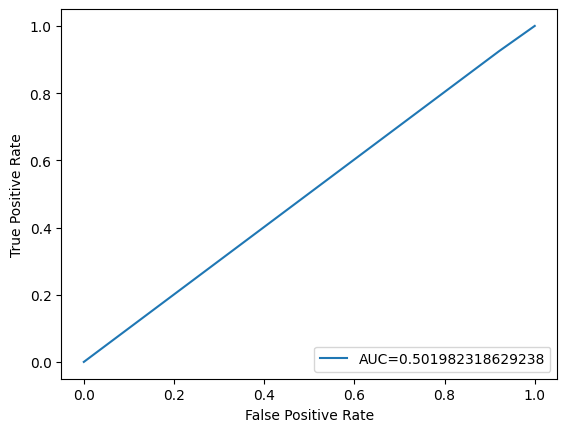

In [61]:
model=SVC()
model.fit(x_train,y_train)
#calculate train accuracy 
y_train_pred=model.predict(x_train)
print('Train accuracy score = {:.5}'.format(accuracy_score(y_train,y_train_pred)))
print('Train precision score = {:.5}'.format(precision_score(y_train,y_train_pred)))
print('Train recall score = {:.5}'.format(recall_score(y_train,y_train_pred)))
print('Train F1 score = {:.5}'.format(f1_score(y_train,y_train_pred)))
print('Train AUC score = {:.5}'.format(roc_auc_score(y_train,y_train_pred)))
#calculate test accuracy
y_test_pred=model.predict(x_test)
print('Test accuracy score = {:.5}'.format(accuracy_score(y_test,y_test_pred)))
print('Test precision score = {:.5}'.format(precision_score(y_test,y_test_pred)))
print('Test recall score = {:.5}'.format(recall_score(y_test,y_test_pred)))
print('Test F1 score = {:.5}'.format(f1_score(y_test,y_test_pred)))
print('Test AUC score = {:.5}'.format(roc_auc_score(y_test,y_test_pred)))
#the confusion matrix
print(pd.DataFrame(confusion_matrix(y_test,y_test_pred)))
#define metrics
fpr, tpr, _ = metrics.roc_curve(y_test,  y_test_pred)
auc = metrics.roc_auc_score(y_test, y_test_pred)
#create ROC curve
plt.plot(fpr,tpr,label="AUC="+str(auc))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

Train accuracy score = 0.69651
Train precision score = 0.69379
Train recall score = 0.61655
Train F1 score = 0.65289
Train AUC score = 0.69099
Test accuracy score = 0.80985
Test precision score = 0.87694
Test recall score = 0.9109
Test F1 score = 0.8936
Test AUC score = 0.5016
     0     1
0   96   944
1  658  6727


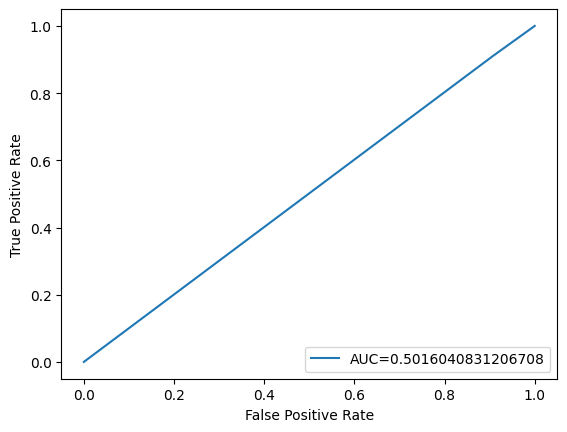

In [62]:
model=svm.LinearSVC()
model.fit(x_train,y_train)
#calculate train accuracy 
y_train_pred=model.predict(x_train)
print('Train accuracy score = {:.5}'.format(accuracy_score(y_train,y_train_pred)))
print('Train precision score = {:.5}'.format(precision_score(y_train,y_train_pred)))
print('Train recall score = {:.5}'.format(recall_score(y_train,y_train_pred)))
print('Train F1 score = {:.5}'.format(f1_score(y_train,y_train_pred)))
print('Train AUC score = {:.5}'.format(roc_auc_score(y_train,y_train_pred)))
#calculate test accuracy
y_test_pred=model.predict(x_test)
print('Test accuracy score = {:.5}'.format(accuracy_score(y_test,y_test_pred)))
print('Test precision score = {:.5}'.format(precision_score(y_test,y_test_pred)))
print('Test recall score = {:.5}'.format(recall_score(y_test,y_test_pred)))
print('Test F1 score = {:.5}'.format(f1_score(y_test,y_test_pred)))
print('Test AUC score = {:.5}'.format(roc_auc_score(y_test,y_test_pred)))
#the confusion matrix
print(pd.DataFrame(confusion_matrix(y_test,y_test_pred)))
#define metrics
fpr, tpr, _ = metrics.roc_curve(y_test,  y_test_pred)
auc = metrics.roc_auc_score(y_test, y_test_pred)
#create ROC curve
plt.plot(fpr,tpr,label="AUC="+str(auc))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

Train accuracy score = 0.74483
Train precision score = 0.75258
Train recall score = 0.66863
Train F1 score = 0.70812
Train AUC score = 0.73957
Test accuracy score = 0.62053
Test precision score = 0.88493
Test recall score = 0.65186
Test F1 score = 0.75072
Test AUC score = 0.52497
      0     1
0   414   626
1  2571  4814


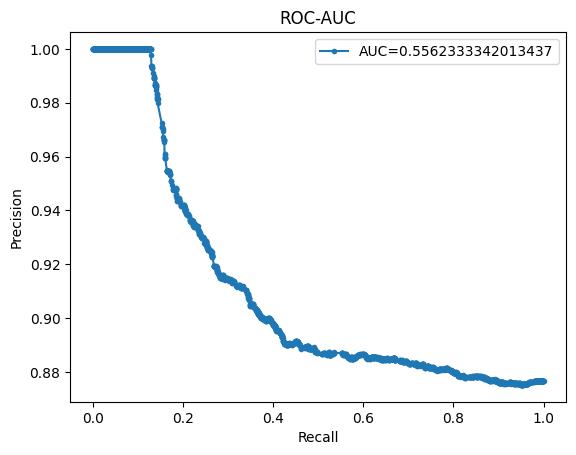

In [63]:
model=RandomForestClassifier(n_estimators=100,criterion='gini',random_state=1,max_leaf_nodes=8)
model.fit(x_train,y_train)
#calculate train accuracy 
y_train_pred=model.predict(x_train)
print('Train accuracy score = {:.5}'.format(accuracy_score(y_train,y_train_pred)))
print('Train precision score = {:.5}'.format(precision_score(y_train,y_train_pred)))
print('Train recall score = {:.5}'.format(recall_score(y_train,y_train_pred)))
print('Train F1 score = {:.5}'.format(f1_score(y_train,y_train_pred)))
print('Train AUC score = {:.5}'.format(roc_auc_score(y_train,y_train_pred)))
#calculate test accuracy
y_test_pred=model.predict(x_test)
print('Test accuracy score = {:.5}'.format(accuracy_score(y_test,y_test_pred)))
print('Test precision score = {:.5}'.format(precision_score(y_test,y_test_pred)))
print('Test recall score = {:.5}'.format(recall_score(y_test,y_test_pred)))
print('Test F1 score = {:.5}'.format(f1_score(y_test,y_test_pred)))
print('Test AUC score = {:.5}'.format(roc_auc_score(y_test,y_test_pred)))
#the confusion matrix
print(pd.DataFrame(confusion_matrix(y_test,y_test_pred)))
#define metrics
predictionForest = model.predict_proba(x_test)[:, 1]
auc = roc_auc_score(y_test, predictionForest)
#create ROC curve
precision, recall, th = precision_recall_curve(y_test, predictionForest)
plt.plot(recall, precision, marker='.',label="AUC="+str(auc))
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("ROC-AUC")
plt.legend()
plt.show()

Train accuracy score = 0.69877
Train precision score = 0.69623
Train recall score = 0.61968
Train F1 score = 0.65573
Train AUC score = 0.69332
Test accuracy score = 0.80392
Test precision score = 0.87663
Test recall score = 0.90345
Test F1 score = 0.88984
Test AUC score = 0.50028
     0     1
0  101   939
1  713  6672


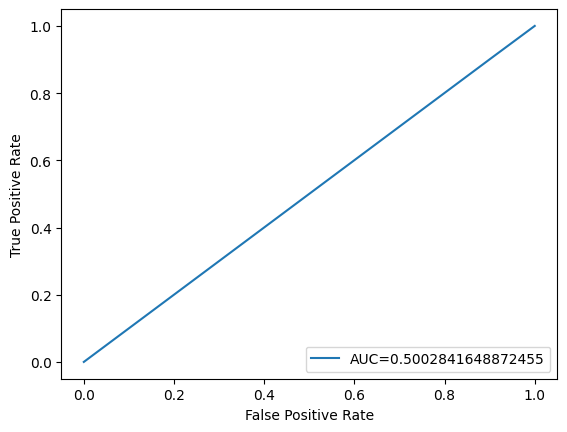

In [64]:
model=LogisticRegression()
model.fit(x_train,y_train)
#calculate train accuracy 
y_train_pred=model.predict(x_train)
print('Train accuracy score = {:.5}'.format(accuracy_score(y_train,y_train_pred)))
print('Train precision score = {:.5}'.format(precision_score(y_train,y_train_pred)))
print('Train recall score = {:.5}'.format(recall_score(y_train,y_train_pred)))
print('Train F1 score = {:.5}'.format(f1_score(y_train,y_train_pred)))
print('Train AUC score = {:.5}'.format(roc_auc_score(y_train,y_train_pred)))
#calculate test accuracy
y_test_pred=model.predict(x_test)
print('Test accuracy score = {:.5}'.format(accuracy_score(y_test,y_test_pred)))
print('Test precision score = {:.5}'.format(precision_score(y_test,y_test_pred)))
print('Test recall score = {:.5}'.format(recall_score(y_test,y_test_pred)))
print('Test F1 score = {:.5}'.format(f1_score(y_test,y_test_pred)))
print('Test AUC score = {:.5}'.format(roc_auc_score(y_test,y_test_pred)))
#the confusion matrix
print(pd.DataFrame(confusion_matrix(y_test,y_test_pred)))
#define metrics
fpr, tpr, _ = metrics.roc_curve(y_test,  y_test_pred)
auc = metrics.roc_auc_score(y_test, y_test_pred)
#create ROC curve
plt.plot(fpr,tpr,label="AUC="+str(auc))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

Train accuracy score = 0.87183
Train precision score = 0.87966
Train recall score = 0.83775
Train F1 score = 0.85819
Train AUC score = 0.86948
Test accuracy score = 0.70267
Test precision score = 0.88341
Test recall score = 0.76127
Test F1 score = 0.8178
Test AUC score = 0.52391
      0     1
0   298   742
1  1763  5622


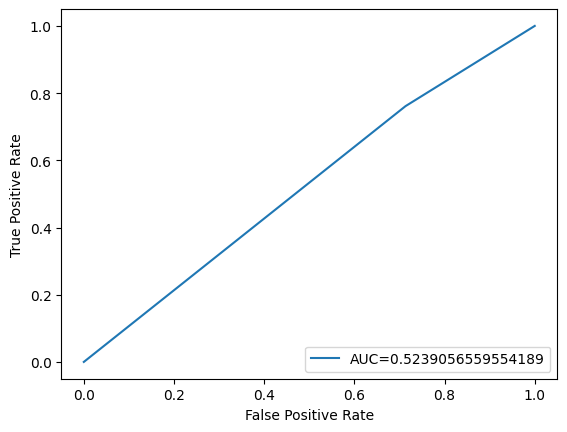

In [66]:
model=KNeighborsClassifier()
model.fit(x_train,y_train)
#calculate train accuracy 
y_train_pred=model.predict(x_train)
print('Train accuracy score = {:.5}'.format(accuracy_score(y_train,y_train_pred)))
print('Train precision score = {:.5}'.format(precision_score(y_train,y_train_pred)))
print('Train recall score = {:.5}'.format(recall_score(y_train,y_train_pred)))
print('Train F1 score = {:.5}'.format(f1_score(y_train,y_train_pred)))
print('Train AUC score = {:.5}'.format(roc_auc_score(y_train,y_train_pred)))
#calculate test accuracy
y_test_pred=model.predict(x_test)
print('Test accuracy score = {:.5}'.format(accuracy_score(y_test,y_test_pred)))
print('Test precision score = {:.5}'.format(precision_score(y_test,y_test_pred)))
print('Test recall score = {:.5}'.format(recall_score(y_test,y_test_pred)))
print('Test F1 score = {:.5}'.format(f1_score(y_test,y_test_pred)))
print('Test AUC score = {:.5}'.format(roc_auc_score(y_test,y_test_pred)))
#the confusion matrix
print(pd.DataFrame(confusion_matrix(y_test,y_test_pred)))
#define metrics
fpr, tpr, _ = metrics.roc_curve(y_test,  y_test_pred)
auc = metrics.roc_auc_score(y_test, y_test_pred)
#create ROC curve
plt.plot(fpr,tpr,label="AUC="+str(auc))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

Train accuracy score = 0.98982
Train precision score = 1.0
Train recall score = 0.97801
Train F1 score = 0.98888
Train AUC score = 0.98901
Test accuracy score = 0.72712
Test precision score = 0.88908
Test recall score = 0.78687
Test F1 score = 0.83485
Test AUC score = 0.54487
      0     1
0   315   725
1  1574  5811


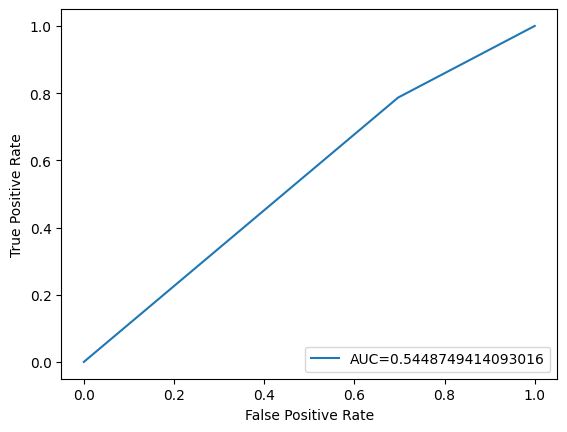

In [67]:
model=DecisionTreeClassifier()
model.fit(x_train,y_train)
#calculate train accuracy 
y_train_pred=model.predict(x_train)
print('Train accuracy score = {:.5}'.format(accuracy_score(y_train,y_train_pred)))
print('Train precision score = {:.5}'.format(precision_score(y_train,y_train_pred)))
print('Train recall score = {:.5}'.format(recall_score(y_train,y_train_pred)))
print('Train F1 score = {:.5}'.format(f1_score(y_train,y_train_pred)))
print('Train AUC score = {:.5}'.format(roc_auc_score(y_train,y_train_pred)))
#calculate test accuracy
y_test_pred=model.predict(x_test)
print('Test accuracy score = {:.5}'.format(accuracy_score(y_test,y_test_pred)))
print('Test precision score = {:.5}'.format(precision_score(y_test,y_test_pred)))
print('Test recall score = {:.5}'.format(recall_score(y_test,y_test_pred)))
print('Test F1 score = {:.5}'.format(f1_score(y_test,y_test_pred)))
print('Test AUC score = {:.5}'.format(roc_auc_score(y_test,y_test_pred)))
#the confusion matrix
print(pd.DataFrame(confusion_matrix(y_test,y_test_pred)))
#define metrics
fpr, tpr, _ = metrics.roc_curve(y_test,  y_test_pred)
auc = metrics.roc_auc_score(y_test, y_test_pred)
#create ROC curve
plt.plot(fpr,tpr,label="AUC="+str(auc))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

In [70]:
#start from merged dataset
y1 = mdf['class']
x1 = mdf.drop(columns=['class'],axis=1)
#missing values
x1['OCCUPATION_TYPE'].fillna('Other',inplace=True)
#target encoding
from category_encoders import MEstimateEncoder
target1=MEstimateEncoder(m=7,cols=['OCCUPATION_TYPE'])
x1_encode=x1.sample(frac=0.25)
y1_encode=y1[x1_encode.index]
target1.fit(x1_encode,y1_encode)
x1_encoded=target1.transform(x1)
x1_encoded['OCCUPATION_TYPE'].unique()
#one-hot encoding
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for x in x1_encoded:
    if x1_encoded[x].dtypes=='object':
        x1_encoded[x] = le.fit_transform(x1_encoded[x])

In [71]:
from sklearn.model_selection import KFold, cross_val_score

In [80]:
#k-fold on DT
clf = DecisionTreeClassifier(random_state=42)

k_folds = KFold(n_splits = 5)

scores = cross_val_score(clf, x1_encoded, y1, scoring="roc_auc", cv = k_folds)

print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores))

Cross Validation Scores:  [0.5146983  0.51338153 0.5092231  0.52269284 0.48332732]
Average CV Score:  0.5086646190857104
Number of CV Scores used in Average:  5


In [81]:
#stratified k-fold on DT
from sklearn.model_selection import StratifiedKFold

sk_folds = StratifiedKFold(n_splits = 5)

scores = cross_val_score(clf, x1_encoded, y1, scoring="roc_auc", cv = sk_folds)

print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores))

Cross Validation Scores:  [0.51538592 0.51390264 0.5011018  0.49999611 0.51350335]
Average CV Score:  0.5087779633151976
Number of CV Scores used in Average:  5


In [82]:
#k-fold on knn
knn = KNeighborsClassifier()

k_folds = KFold(n_splits = 5)

scores = cross_val_score(knn, x1_encoded, y1, scoring="roc_auc", cv = k_folds)

print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores))

Cross Validation Scores:  [0.52215915 0.5189108  0.51731415 0.52103701 0.5013873 ]
Average CV Score:  0.5161616835341698
Number of CV Scores used in Average:  5


In [83]:
#stratified kfold on knn

sk_folds = StratifiedKFold(n_splits = 5)

scores = cross_val_score(knn, x1_encoded, y1, scoring="roc_auc", cv = sk_folds)

print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores))

Cross Validation Scores:  [0.52073397 0.50618474 0.49090486 0.49623352 0.49167822]
Average CV Score:  0.5011470644617889
Number of CV Scores used in Average:  5


In [76]:
#k-fold on LogisticRegression
lr = LogisticRegression()

k_folds = KFold(n_splits = 10)

scores = cross_val_score(lr, x1_encoded, y1, scoring="roc_auc", cv = k_folds)

print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores))

Cross Validation Scores:  [0.48903041 0.48184773 0.52541804 0.47150066 0.51633576 0.4778978
 0.53098032 0.48341532 0.52837723 0.49680514]
Average CV Score:  0.50016084035653
Number of CV Scores used in Average:  10


In [77]:
#stratified kfold on LogisticRegression

sk_folds = StratifiedKFold(n_splits = 10)

scores = cross_val_score(lr, x1_encoded, y1, scoring="roc_auc", cv = sk_folds)

print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores))

Cross Validation Scores:  [0.49113606 0.47631232 0.52941561 0.46587089 0.52265988 0.4834146
 0.54997145 0.49584732 0.52351401 0.48475968]
Average CV Score:  0.5022901828915446
Number of CV Scores used in Average:  10
